# GAFIS — Pix2Pix Training (U-Net Generator + PatchGAN Discriminator)

Trains on the paired `input/`/`target/` fingerprint dataset produced by the dataset-generation
notebook (clean target vs. soft-mask degraded + PolyU-noised input).

**Colab setup** — run this first:

```python
from google.colab import drive
drive.mount('/content/drive')

!mkdir -p /content/dataset/input /content/dataset/target
!unzip -q /content/drive/MyDrive/GAFIS/input_images.zip  -d /content/dataset/input
!unzip -q /content/drive/MyDrive/GAFIS/target_images.zip -d /content/dataset/target
```

Then Runtime → Change runtime type → GPU, and run the cells below top to bottom.

Sections:
1. Setup & config
2. Dataset loading + sanity check (visualize a batch of real pairs before training)
3. Model definitions (Generator, Discriminator)
4. Training loop (saves checkpoints + sample grids periodically)
5. Loss curves
6. Quantitative evaluation (PSNR / SSIM) — how well the GAN actually reconstructs the degradation

## 1. Setup & Config

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:

!ls /content/drive/MyDrive/target_images.zip | head
!ls /content/drive/MyDrive/input_images.zip | head

/content/drive/MyDrive/target_images.zip
/content/drive/MyDrive/input_images.zip


In [4]:
import time
from pathlib import Path

import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from torchvision.utils import make_grid

from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

INPUT_DIR = Path("/content/drive/MyDrive/input_images.zip")
TARGET_DIR = Path("/content/drive/MyDrive/target_images.zip")
CHECKPOINT_DIR = Path("/content/checkpoints")
SAMPLE_DIR = Path("/content/samples")

CHECKPOINT_DIR.mkdir(parents=True, exist_ok=True)
SAMPLE_DIR.mkdir(parents=True, exist_ok=True)

IMG_SIZE = 256
BATCH_SIZE = 16
NUM_EPOCHS = 75
LR = 2e-4
BETA1 = 0.5
LAMBDA_L1 = 100.0
VAL_SPLIT = 0.1
SAVE_EVERY = 5

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

Using device: cuda


## 2. Dataset Loading + Sanity Check

Loads pairs by matching filename between `input/` and `target/`, then displays a real batch
before training starts — worth checking the smudges/blur/noise look as expected.

In [5]:
import zipfile

INPUT_ZIP = Path("/content/drive/MyDrive/input_images.zip")
TARGET_ZIP = Path("/content/drive/MyDrive/target_images.zip")

INPUT_DIR = Path("/content/input_images")
TARGET_DIR = Path("/content/target_images")

for zip_path, out_dir in [(INPUT_ZIP, INPUT_DIR), (TARGET_ZIP, TARGET_DIR)]:
    out_dir.mkdir(parents=True, exist_ok=True)
    with zipfile.ZipFile(zip_path, "r") as zf:
        zf.extractall(out_dir)

print("Input files:", len(list(INPUT_DIR.rglob("*.png"))))
print("Target files:", len(list(TARGET_DIR.rglob("*.png"))))

Input files: 6000
Target files: 6000


In [6]:
class FingerprintPairDataset(Dataset):
    def __init__(self, input_dir, target_dir, img_size=256):
        self.input_dir = Path(input_dir)
        self.target_dir = Path(target_dir)

        input_files = {p.name for p in self.input_dir.glob("*.png")}
        target_files = {p.name for p in self.target_dir.glob("*.png")}
        self.filenames = sorted(input_files & target_files)

        missing = input_files.symmetric_difference(target_files)
        if missing:
            print(f"Warning: {len(missing)} filenames not present in both folders (skipped).")

        self.transform = transforms.Compose([
            transforms.Resize((img_size, img_size)),
            transforms.ToTensor(),
            transforms.Normalize([0.5], [0.5]),
        ])

    def __len__(self):
        return len(self.filenames)

    def __getitem__(self, idx):
        fname = self.filenames[idx]
        inp = Image.open(self.input_dir / fname).convert("L")
        tgt = Image.open(self.target_dir / fname).convert("L")
        return self.transform(inp), self.transform(tgt)

full_dataset = FingerprintPairDataset(INPUT_DIR, TARGET_DIR, IMG_SIZE)
print("Total pairs found:", len(full_dataset))

val_size = int(len(full_dataset) * VAL_SPLIT)
train_size = len(full_dataset) - val_size
train_ds, val_ds = torch.utils.data.random_split(
    full_dataset, [train_size, val_size], generator=torch.Generator().manual_seed(42)
)

train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True, num_workers=2, drop_last=True)
val_loader = DataLoader(val_ds, batch_size=8, shuffle=True, num_workers=2)

print(f"Train pairs: {len(train_ds)} | Val pairs: {len(val_ds)}")

Total pairs found: 6000
Train pairs: 5400 | Val pairs: 600


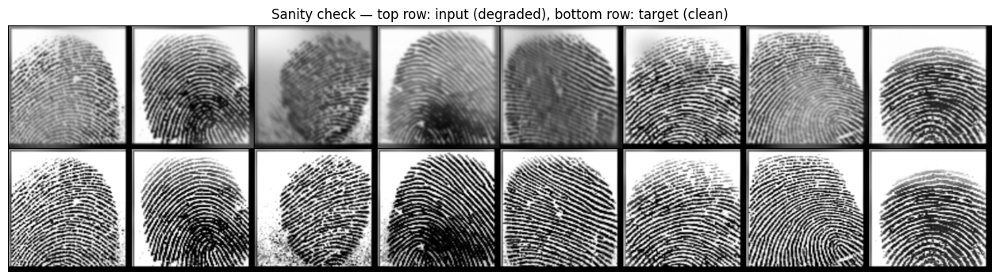

In [7]:
# Sanity check: visualize one real batch (input vs target) before training
sample_inp, sample_tgt = next(iter(train_loader))

grid = make_grid(torch.cat([sample_inp[:8], sample_tgt[:8]], dim=0), nrow=8, normalize=True)
plt.figure(figsize=(16, 5))
plt.imshow(grid.permute(1, 2, 0).numpy(), cmap="gray")
plt.axis("off")
plt.title("Sanity check — top row: input (degraded), bottom row: target (clean)")
plt.show()

## 3. Model Definitions — U-Net Generator + PatchGAN Discriminator

In [8]:
class UNetDown(nn.Module):
    def __init__(self, in_ch, out_ch, normalize=True, dropout=0.0):
        super().__init__()
        layers = [nn.Conv2d(in_ch, out_ch, 4, 2, 1, bias=False)]
        if normalize:
            layers.append(nn.BatchNorm2d(out_ch))
        layers.append(nn.LeakyReLU(0.2))
        if dropout:
            layers.append(nn.Dropout(dropout))
        self.model = nn.Sequential(*layers)

    def forward(self, x):
        return self.model(x)


class UNetUp(nn.Module):
    def __init__(self, in_ch, out_ch, dropout=0.0):
        super().__init__()
        layers = [
            nn.ConvTranspose2d(in_ch, out_ch, 4, 2, 1, bias=False),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
        ]
        if dropout:
            layers.append(nn.Dropout(dropout))
        self.model = nn.Sequential(*layers)

    def forward(self, x, skip):
        x = self.model(x)
        return torch.cat([x, skip], dim=1)


class GeneratorUNet(nn.Module):
    """256x256, 1-channel in/out U-Net generator."""

    def __init__(self, in_ch=1, out_ch=1):
        super().__init__()
        self.down1 = UNetDown(in_ch, 64, normalize=False)
        self.down2 = UNetDown(64, 128)
        self.down3 = UNetDown(128, 256)
        self.down4 = UNetDown(256, 512, dropout=0.5)
        self.down5 = UNetDown(512, 512, dropout=0.5)
        self.down6 = UNetDown(512, 512, dropout=0.5)
        self.down7 = UNetDown(512, 512, dropout=0.5)
        self.down8 = UNetDown(512, 512, normalize=False, dropout=0.5)

        self.up1 = UNetUp(512, 512, dropout=0.5)
        self.up2 = UNetUp(1024, 512, dropout=0.5)
        self.up3 = UNetUp(1024, 512, dropout=0.5)
        self.up4 = UNetUp(1024, 512, dropout=0.5)
        self.up5 = UNetUp(1024, 256)
        self.up6 = UNetUp(512, 128)
        self.up7 = UNetUp(256, 64)

        self.final = nn.Sequential(
            nn.ConvTranspose2d(128, out_ch, 4, 2, 1),
            nn.Tanh(),
        )

    def forward(self, x):
        d1 = self.down1(x)
        d2 = self.down2(d1)
        d3 = self.down3(d2)
        d4 = self.down4(d3)
        d5 = self.down5(d4)
        d6 = self.down6(d5)
        d7 = self.down7(d6)
        d8 = self.down8(d7)

        u1 = self.up1(d8, d7)
        u2 = self.up2(u1, d6)
        u3 = self.up3(u2, d5)
        u4 = self.up4(u3, d4)
        u5 = self.up5(u4, d3)
        u6 = self.up6(u5, d2)
        u7 = self.up7(u6, d1)

        return self.final(u7)


class Discriminator(nn.Module):
    """Takes concatenated (input, target_or_generated) -> patch predictions."""

    def __init__(self, in_ch=2):
        super().__init__()

        def block(in_f, out_f, normalize=True):
            layers = [nn.Conv2d(in_f, out_f, 4, 2, 1)]
            if normalize:
                layers.append(nn.BatchNorm2d(out_f))
            layers.append(nn.LeakyReLU(0.2))
            return layers

        self.model = nn.Sequential(
            *block(in_ch, 64, normalize=False),
            *block(64, 128),
            *block(128, 256),
            *block(256, 512),
            nn.ZeroPad2d((1, 0, 1, 0)),
            nn.Conv2d(512, 1, 4, 1, 1),
        )

    def forward(self, img_a, img_b):
        return self.model(torch.cat([img_a, img_b], dim=1))


generator = GeneratorUNet().to(device)
discriminator = Discriminator().to(device)

criterion_gan = nn.BCEWithLogitsLoss()
criterion_l1 = nn.L1Loss()

optimizer_g = torch.optim.Adam(generator.parameters(), lr=LR, betas=(BETA1, 0.999))
optimizer_d = torch.optim.Adam(discriminator.parameters(), lr=LR, betas=(BETA1, 0.999))

print(f"Generator params: {sum(p.numel() for p in generator.parameters()):,}")
print(f"Discriminator params: {sum(p.numel() for p in discriminator.parameters()):,}")

Generator params: 54,407,809
Discriminator params: 2,765,505


## 4. Training Loop

Saves a checkpoint + a sample grid (input / generated / target rows) every `SAVE_EVERY` epochs
so you can watch reconstruction quality improve directly, epoch by epoch.

Epoch 1/75 | G: 15.3418 | D: 0.4990 | L1: 0.1397 | 164.6s
Epoch 2/75 | G: 11.5268 | D: 0.3226 | L1: 0.0916 | 165.0s
Epoch 3/75 | G: 11.0843 | D: 0.2924 | L1: 0.0800 | 164.7s
Epoch 4/75 | G: 11.3240 | D: 0.1682 | L1: 0.0760 | 164.5s
Epoch 5/75 | G: 11.8542 | D: 0.1615 | L1: 0.0748 | 164.7s


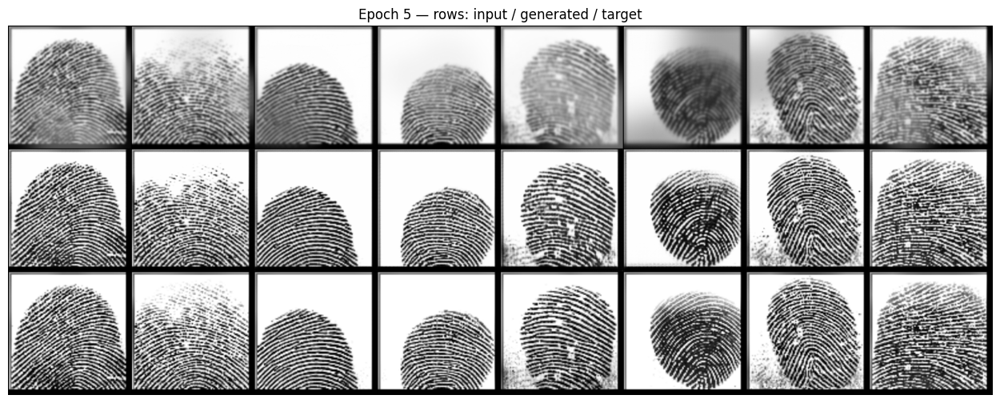

Epoch 6/75 | G: 11.3038 | D: 0.1971 | L1: 0.0731 | 165.0s
Epoch 7/75 | G: 10.4553 | D: 0.2535 | L1: 0.0716 | 164.4s
Epoch 8/75 | G: 10.1659 | D: 0.2477 | L1: 0.0704 | 165.1s
Epoch 9/75 | G: 9.9584 | D: 0.2439 | L1: 0.0695 | 164.8s
Epoch 10/75 | G: 9.8918 | D: 0.2370 | L1: 0.0680 | 164.6s


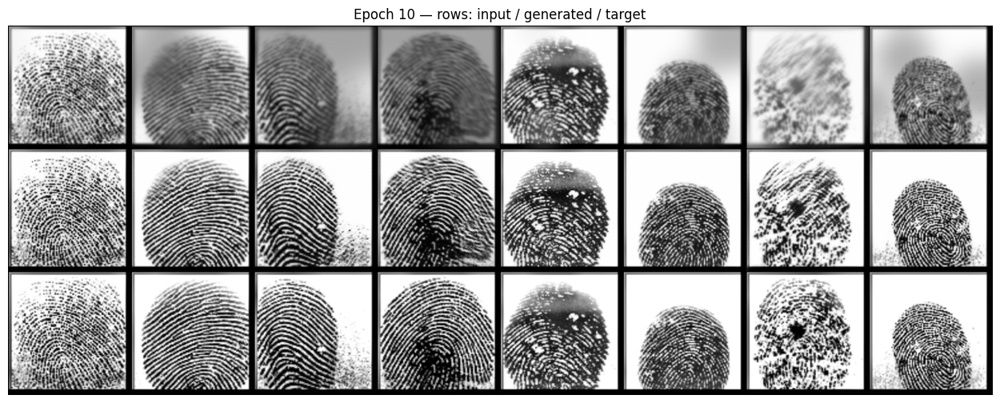

Epoch 11/75 | G: 10.4167 | D: 0.1872 | L1: 0.0677 | 165.0s
Epoch 12/75 | G: 10.2729 | D: 0.1984 | L1: 0.0663 | 164.4s
Epoch 13/75 | G: 9.9938 | D: 0.2264 | L1: 0.0657 | 165.2s
Epoch 14/75 | G: 10.4449 | D: 0.1928 | L1: 0.0648 | 165.4s
Epoch 15/75 | G: 9.8926 | D: 0.1837 | L1: 0.0636 | 164.4s


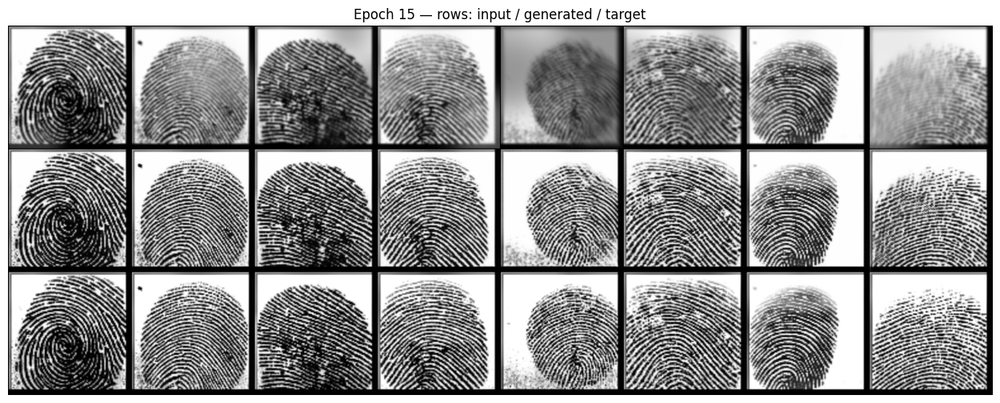

Epoch 16/75 | G: 10.7393 | D: 0.1907 | L1: 0.0633 | 165.1s
Epoch 17/75 | G: 9.6356 | D: 0.1953 | L1: 0.0620 | 164.2s
Epoch 18/75 | G: 10.4529 | D: 0.1518 | L1: 0.0622 | 164.9s
Epoch 19/75 | G: 10.0428 | D: 0.1923 | L1: 0.0618 | 164.5s
Epoch 20/75 | G: 10.0018 | D: 0.1778 | L1: 0.0612 | 165.1s


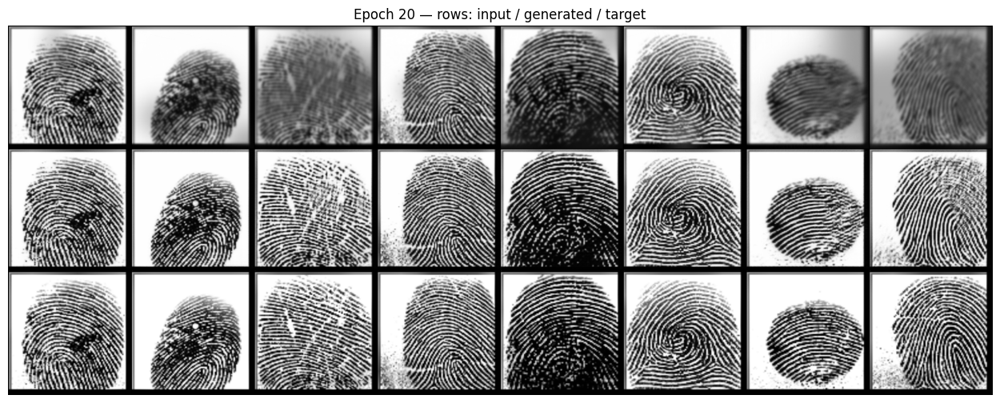

Epoch 21/75 | G: 10.5765 | D: 0.1456 | L1: 0.0611 | 164.8s
Epoch 22/75 | G: 10.2380 | D: 0.1667 | L1: 0.0603 | 164.8s
Epoch 23/75 | G: 9.7727 | D: 0.2003 | L1: 0.0600 | 165.3s
Epoch 24/75 | G: 10.3228 | D: 0.1364 | L1: 0.0600 | 164.6s
Epoch 25/75 | G: 10.0767 | D: 0.1859 | L1: 0.0602 | 164.3s


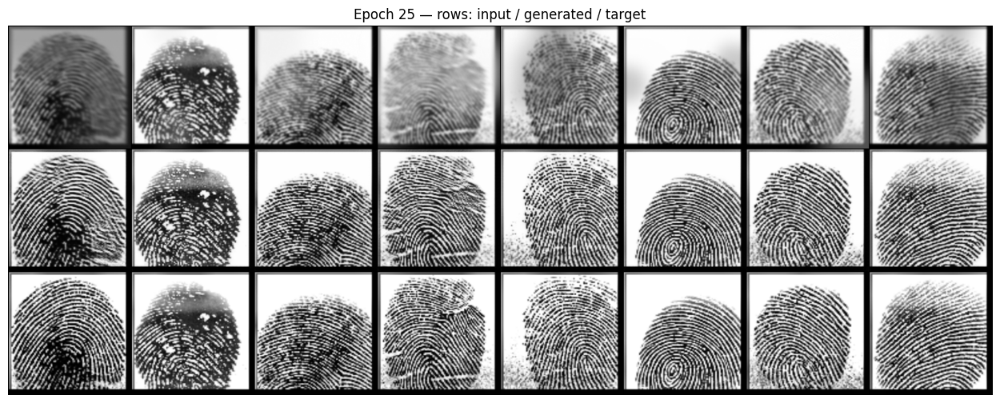

Epoch 26/75 | G: 10.5403 | D: 0.1497 | L1: 0.0599 | 164.9s
Epoch 27/75 | G: 10.2726 | D: 0.1582 | L1: 0.0606 | 165.7s
Epoch 28/75 | G: 10.2150 | D: 0.1622 | L1: 0.0594 | 165.6s
Epoch 29/75 | G: 10.3783 | D: 0.1326 | L1: 0.0588 | 164.8s
Epoch 30/75 | G: 10.0281 | D: 0.2315 | L1: 0.0590 | 164.8s


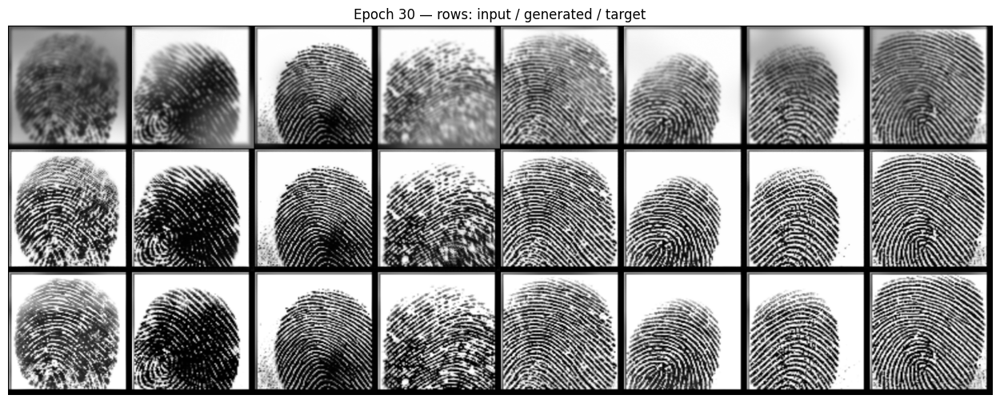

Epoch 31/75 | G: 10.2807 | D: 0.0907 | L1: 0.0578 | 164.6s
Epoch 32/75 | G: 9.3704 | D: 0.2525 | L1: 0.0576 | 164.6s
Epoch 33/75 | G: 10.7360 | D: 0.0637 | L1: 0.0576 | 165.4s
Epoch 34/75 | G: 9.9995 | D: 0.1995 | L1: 0.0578 | 164.4s
Epoch 35/75 | G: 9.4797 | D: 0.2418 | L1: 0.0573 | 165.3s


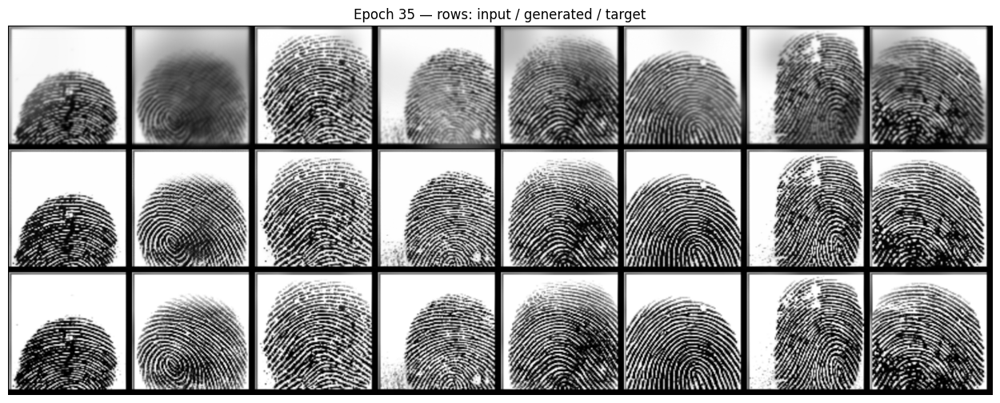

Epoch 36/75 | G: 10.2974 | D: 0.0904 | L1: 0.0571 | 165.0s
Epoch 37/75 | G: 9.3414 | D: 0.2439 | L1: 0.0563 | 164.4s
Epoch 38/75 | G: 10.5335 | D: 0.0874 | L1: 0.0569 | 165.0s
Epoch 39/75 | G: 10.7567 | D: 0.1371 | L1: 0.0572 | 165.2s
Epoch 40/75 | G: 9.1433 | D: 0.2352 | L1: 0.0555 | 165.1s


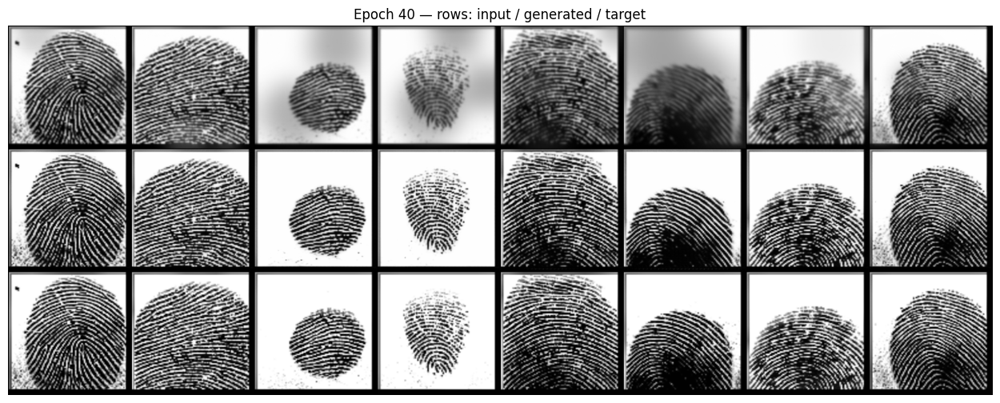

Epoch 41/75 | G: 9.4897 | D: 0.2175 | L1: 0.0565 | 164.8s
Epoch 42/75 | G: 9.9848 | D: 0.1486 | L1: 0.0555 | 165.5s
Epoch 43/75 | G: 9.9709 | D: 0.1272 | L1: 0.0566 | 165.3s
Epoch 44/75 | G: 9.7708 | D: 0.1883 | L1: 0.0559 | 165.3s
Epoch 45/75 | G: 9.6627 | D: 0.1640 | L1: 0.0549 | 165.1s


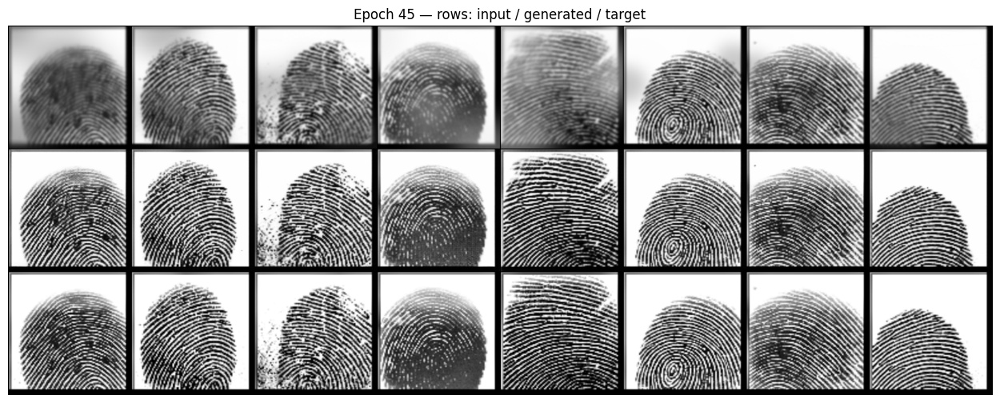

Epoch 46/75 | G: 9.5240 | D: 0.1988 | L1: 0.0546 | 165.6s
Epoch 47/75 | G: 9.4400 | D: 0.1883 | L1: 0.0546 | 164.4s
Epoch 48/75 | G: 10.9749 | D: 0.0658 | L1: 0.0554 | 164.5s
Epoch 49/75 | G: 8.9246 | D: 0.3081 | L1: 0.0542 | 165.0s
Epoch 50/75 | G: 9.7333 | D: 0.1403 | L1: 0.0540 | 165.5s


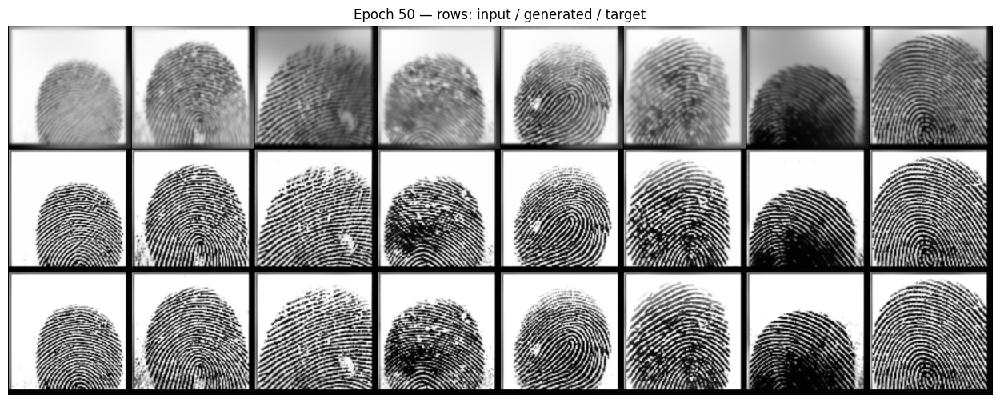

Epoch 51/75 | G: 9.3398 | D: 0.2131 | L1: 0.0542 | 165.4s
Epoch 52/75 | G: 9.3615 | D: 0.2021 | L1: 0.0538 | 165.5s
Epoch 53/75 | G: 9.7132 | D: 0.1392 | L1: 0.0534 | 165.3s
Epoch 54/75 | G: 9.7148 | D: 0.1872 | L1: 0.0534 | 164.1s
Epoch 55/75 | G: 9.5028 | D: 0.1920 | L1: 0.0534 | 164.8s


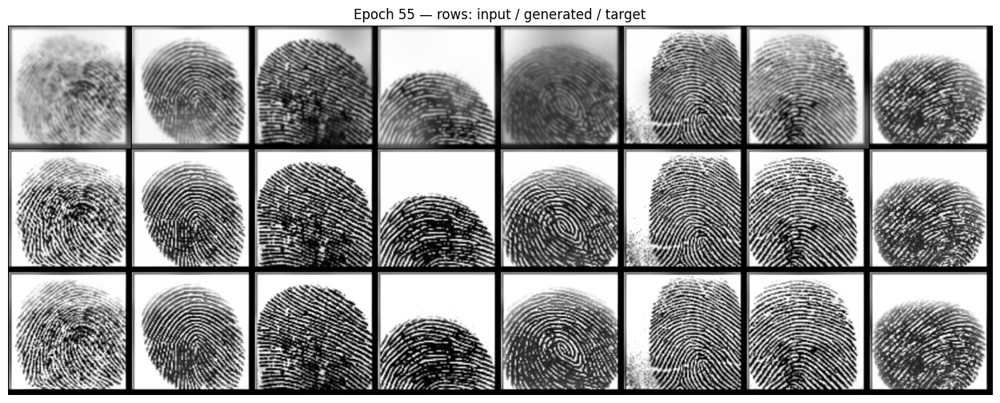

Epoch 56/75 | G: 9.7641 | D: 0.1932 | L1: 0.0532 | 165.5s
Epoch 57/75 | G: 10.3804 | D: 0.0751 | L1: 0.0535 | 164.5s
Epoch 58/75 | G: 8.9796 | D: 0.2347 | L1: 0.0533 | 164.5s
Epoch 59/75 | G: 8.9525 | D: 0.2423 | L1: 0.0527 | 164.4s
Epoch 60/75 | G: 9.8061 | D: 0.1355 | L1: 0.0528 | 164.6s


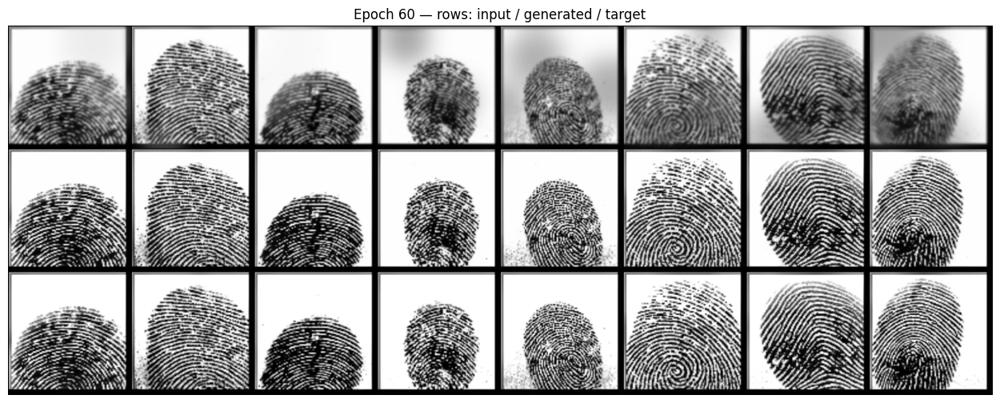

Epoch 61/75 | G: 9.9188 | D: 0.1298 | L1: 0.0529 | 165.6s
Epoch 62/75 | G: 9.7592 | D: 0.1739 | L1: 0.0528 | 165.3s
Epoch 63/75 | G: 9.6206 | D: 0.2530 | L1: 0.0533 | 165.2s
Epoch 64/75 | G: 9.3548 | D: 0.1543 | L1: 0.0523 | 165.3s
Epoch 65/75 | G: 10.0176 | D: 0.1350 | L1: 0.0527 | 165.1s


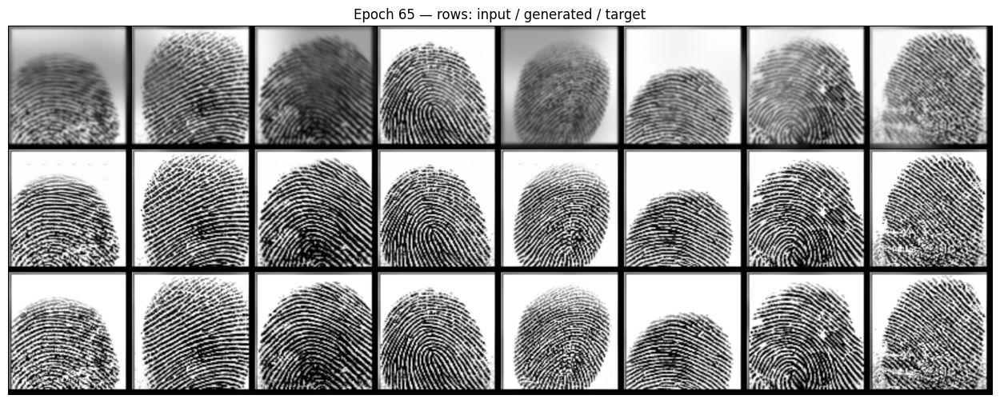

Epoch 66/75 | G: 8.9454 | D: 0.2554 | L1: 0.0519 | 165.0s
Epoch 67/75 | G: 9.6761 | D: 0.1373 | L1: 0.0522 | 164.4s
Epoch 68/75 | G: 9.5952 | D: 0.1776 | L1: 0.0520 | 165.7s
Epoch 69/75 | G: 10.3524 | D: 0.1664 | L1: 0.0527 | 165.1s
Epoch 70/75 | G: 8.9444 | D: 0.1977 | L1: 0.0519 | 165.0s


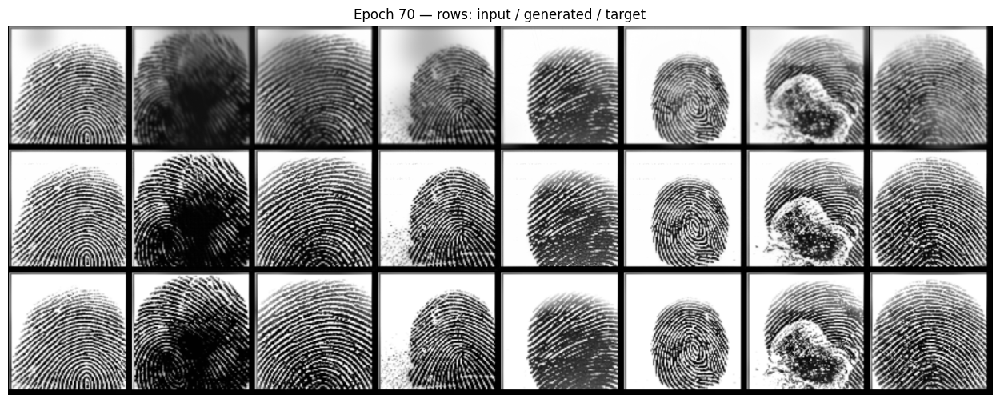

Epoch 71/75 | G: 9.7895 | D: 0.1607 | L1: 0.0521 | 165.4s
Epoch 72/75 | G: 9.1173 | D: 0.2219 | L1: 0.0516 | 165.2s
Epoch 73/75 | G: 9.8162 | D: 0.1207 | L1: 0.0518 | 164.4s
Epoch 74/75 | G: 9.3361 | D: 0.2136 | L1: 0.0516 | 164.2s
Epoch 75/75 | G: 9.4401 | D: 0.1763 | L1: 0.0514 | 164.3s


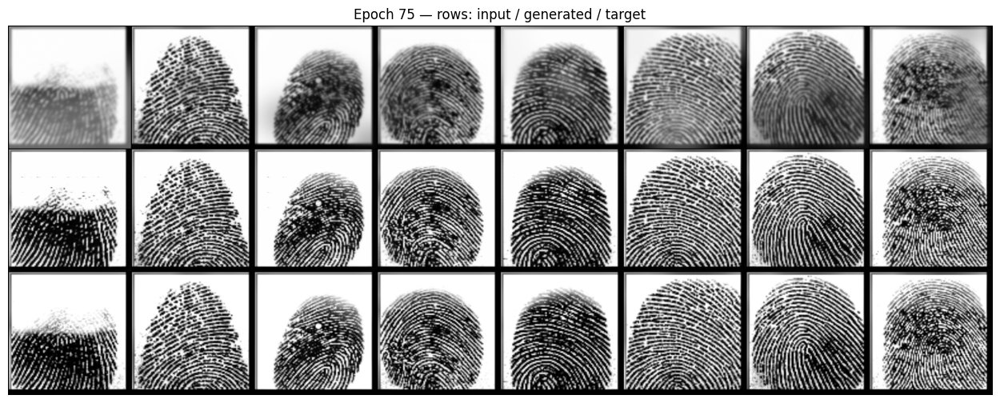

In [9]:
def save_sample_grid(epoch):
    generator.eval()
    with torch.no_grad():
        inp, tgt = next(iter(val_loader))
        inp, tgt = inp.to(device), tgt.to(device)
        fake = generator(inp)

        grid = make_grid(torch.cat([inp, fake, tgt], dim=0), nrow=inp.size(0), normalize=True)
        grid = grid.cpu().permute(1, 2, 0).numpy()

        plt.figure(figsize=(16, 6))
        plt.imshow(grid, cmap="gray")
        plt.axis("off")
        plt.title(f"Epoch {epoch} — rows: input / generated / target")
        plt.savefig(SAMPLE_DIR / f"epoch_{epoch:03d}.png", bbox_inches="tight")
        plt.show()
    generator.train()


history = {"g_loss": [], "d_loss": [], "l1_loss": []}

for epoch in range(1, NUM_EPOCHS + 1):
    start = time.time()
    epoch_g, epoch_d, epoch_l1 = 0.0, 0.0, 0.0

    for inp, tgt in train_loader:
        inp, tgt = inp.to(device), tgt.to(device)

        with torch.no_grad():
            patch_shape = discriminator(inp, tgt).shape

        valid = torch.ones(patch_shape, device=device)
        fake_label = torch.zeros(patch_shape, device=device)

        # ---- Train Generator ----
        optimizer_g.zero_grad()
        fake = generator(inp)
        pred_fake = discriminator(inp, fake)

        loss_gan = criterion_gan(pred_fake, valid)
        loss_l1 = criterion_l1(fake, tgt)
        loss_g = loss_gan + LAMBDA_L1 * loss_l1
        loss_g.backward()
        optimizer_g.step()

        # ---- Train Discriminator ----
        optimizer_d.zero_grad()
        pred_real = discriminator(inp, tgt)
        loss_real = criterion_gan(pred_real, valid)

        pred_fake_detached = discriminator(inp, fake.detach())
        loss_fake = criterion_gan(pred_fake_detached, fake_label)

        loss_d = 0.5 * (loss_real + loss_fake)
        loss_d.backward()
        optimizer_d.step()

        epoch_g += loss_g.item()
        epoch_d += loss_d.item()
        epoch_l1 += loss_l1.item()

    n_batches = len(train_loader)
    history["g_loss"].append(epoch_g / n_batches)
    history["d_loss"].append(epoch_d / n_batches)
    history["l1_loss"].append(epoch_l1 / n_batches)

    elapsed = time.time() - start
    print(f"Epoch {epoch}/{NUM_EPOCHS} | G: {epoch_g/n_batches:.4f} | "
          f"D: {epoch_d/n_batches:.4f} | L1: {epoch_l1/n_batches:.4f} | {elapsed:.1f}s")

    if epoch % SAVE_EVERY == 0 or epoch == NUM_EPOCHS:
        torch.save(generator.state_dict(), CHECKPOINT_DIR / f"generator_epoch{epoch}.pth")
        torch.save(discriminator.state_dict(), CHECKPOINT_DIR / f"discriminator_epoch{epoch}.pth")
        save_sample_grid(epoch)

## 5. Loss Curves

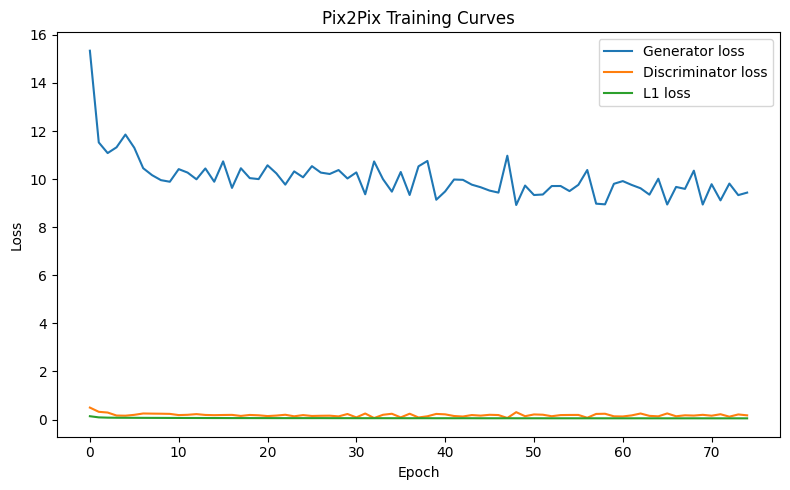

In [10]:
plt.figure(figsize=(8, 5))
plt.plot(history["g_loss"], label="Generator loss")
plt.plot(history["d_loss"], label="Discriminator loss")
plt.plot(history["l1_loss"], label="L1 loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Pix2Pix Training Curves")
plt.legend()
plt.tight_layout()
plt.savefig(CHECKPOINT_DIR / "training_curves.png")
plt.show()

## 6. Quantitative Evaluation — PSNR / SSIM on the Validation Set

This is the direct, numeric answer to "how well does the GAN actually reconstruct the
degradation": PSNR (higher = closer to target in pixel intensity) and SSIM (higher = closer in
structural/ridge similarity, 1.0 = identical). Comparing input-vs-target against
generated-vs-target shows how much the GAN actually improved over doing nothing.

In [11]:
generator.eval()

psnr_gen_list, ssim_gen_list = [], []
psnr_input_list, ssim_input_list = [], []

with torch.no_grad():
    for inp, tgt in val_loader:
        inp, tgt = inp.to(device), tgt.to(device)
        fake = generator(inp)

        # move to numpy, [-1,1] -> [0,1]
        inp_np = ((inp.cpu().numpy() + 1) / 2)
        tgt_np = ((tgt.cpu().numpy() + 1) / 2)
        fake_np = ((fake.cpu().numpy() + 1) / 2)

        for i in range(inp_np.shape[0]):
            t = tgt_np[i, 0]
            g = np.clip(fake_np[i, 0], 0, 1)
            x = inp_np[i, 0]

            psnr_gen_list.append(psnr(t, g, data_range=1.0))
            ssim_gen_list.append(ssim(t, g, data_range=1.0))

            psnr_input_list.append(psnr(t, x, data_range=1.0))
            ssim_input_list.append(ssim(t, x, data_range=1.0))

print("Degraded input vs target  -> PSNR: {:.2f} dB | SSIM: {:.4f}".format(
    np.mean(psnr_input_list), np.mean(ssim_input_list)))
print("GAN output vs target      -> PSNR: {:.2f} dB | SSIM: {:.4f}".format(
    np.mean(psnr_gen_list), np.mean(ssim_gen_list)))

Degraded input vs target  -> PSNR: 16.90 dB | SSIM: 0.6949
GAN output vs target      -> PSNR: 28.58 dB | SSIM: 0.9661


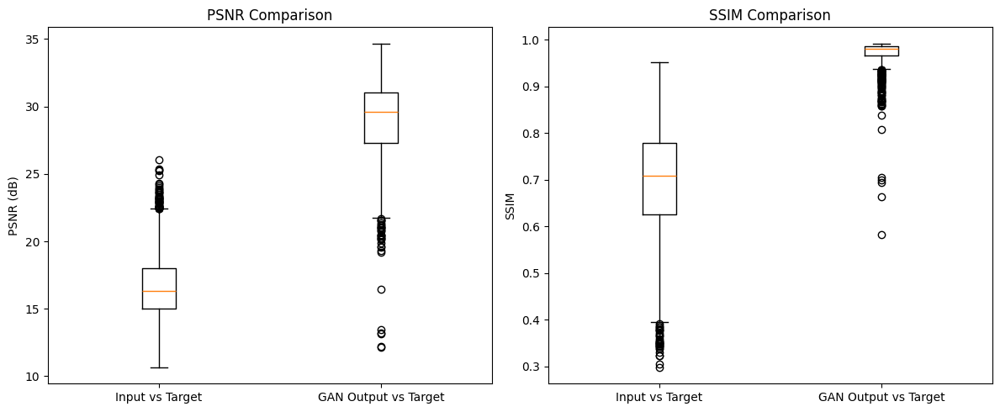

In [12]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

axes[0].boxplot([psnr_input_list, psnr_gen_list], tick_labels=["Input vs Target", "GAN Output vs Target"])
axes[0].set_title("PSNR Comparison")
axes[0].set_ylabel("PSNR (dB)")

axes[1].boxplot([ssim_input_list, ssim_gen_list], tick_labels=["Input vs Target", "GAN Output vs Target"])
axes[1].set_title("SSIM Comparison")
axes[1].set_ylabel("SSIM")

plt.tight_layout()
plt.savefig(CHECKPOINT_DIR / "psnr_ssim_comparison.png")
plt.show()

In [13]:
# A few worst-case and best-case reconstructions, for qualitative inspection
ssim_arr = np.array(ssim_gen_list)
worst_idx = np.argsort(ssim_arr)[:4]
best_idx = np.argsort(ssim_arr)[-4:]
print("Lowest-SSIM (hardest) samples:", worst_idx, "-> likely the heaviest 'severe' smudges")
print("Highest-SSIM (easiest) samples:", best_idx, "-> likely mild degradation")

Lowest-SSIM (hardest) samples: [ 63 222 345  77] -> likely the heaviest 'severe' smudges
Highest-SSIM (easiest) samples: [254 528 303 522] -> likely mild degradation
